In [1]:
import os, sys
from glob import glob
import numpy as np
import dask
import xarray as xr
from scipy.signal import welch
from matplotlib import pyplot as plt
%matplotlib inline

from mitequinox.utils import *
from mitequinox.sigp import *
from mitequinox.plot import *

In [2]:
from dask_jobqueue import PBSCluster
# for heavy processing:
cluster = PBSCluster(cores=6, processes=6, walltime='06:00:00')
w = cluster.scale(6*10)

In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.135.39.24:38220 Dashboard: http://10.135.39.24:8787/status,Cluster Workers: 42 Cores: 42 Memory: 700.14 GB


___________

## Part 1. $E_{\omega}$ in terms of $\omega$ and $E_{total}$

In [10]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
face_all = [10]


open_ocean_depth = 2000

for face in face_all:
    
    ds = xr.open_zarr(work_data_dir+'xy/total_uv/E_uv_f%02d.zarr'%(face))
    chunks={'i': 188, 'j':192, 'freq_time':1440}
    ds = ds.chunk(chunks)     
    E = ds.uv
    #E = E.assign_coords(freq_cps=E.freq_time / 86400.) 
    df=E.freq_time[1]-E.freq_time[0]
    
    # near-inertial
    f_llc = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.YC))
    f_cpd_llc = f_llc*86400/2./np.pi  
    E_f = (E.where((abs(E.freq_time+f_cpd_llc)<0.1) & (E.Depth>open_ocean_depth), other=0.)*df).sum(dim='freq_time')
    
    E_omega = (E.where((abs(E.freq_time)>abs(f_cpd_llc)-0.1) & (E.Depth>open_ocean_depth), other=0.)*df*((E.freq_time/f_cpd_llc)**2)).sum(dim='freq_time')    
    E_omega = E_omega.chunk({'i': 1080, 'j': 1080}) 
    E_omega = np.real(E_omega).rename('E_omega')

    E_omega_all = (E.where(E.Depth>open_ocean_depth, other=0.)*df*((E.freq_time/f_cpd_llc)**2)).sum(dim='freq_time')
    E_omega_all = E_omega_all.chunk({'i': 1080, 'j': 1080}) 
    E_omega_all = np.real(E_omega_all).rename('E_omega_all')

    E_band = xr.merge([E_omega_all, E_omega])    
    file_E = work_data_dir+'xy/1_time_term/E_omega_f%02d.zarr'%face
    E_band.to_zarr(file_E, mode='w')  
    print('face %d done'%face )    

face 10 done


In [11]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]

for face in face_all:
    
    ds = xr.open_zarr(work_data_dir+'xy/total_uv/E_uv_f%02d.zarr'%(face))
    chunks={'i': 188, 'j':192, 'freq_time':1440}
    ds = ds.chunk(chunks)     
    E = ds.uv
    df=E.freq_time[1]-E.freq_time[0]
    
    # near-inertial
    f_llc = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.YC))
    f_cpd_llc = f_llc*86400/2./np.pi  
    E_f = (E.where((abs(E.freq_time+f_cpd_llc)<0.1), other=0.)*df).sum(dim='freq_time')
    
    E_omega = (E.where((abs(E.freq_time)>abs(f_cpd_llc)-0.1), other=0.)*df*((E.freq_time/f_cpd_llc)**2)).sum(dim='freq_time')    
    E_omega = E_omega.chunk({'i': 1080, 'j': 1080}) 
    E_omega = np.real(E_omega).rename('E_omega')

    E_omega_all = (E*df*((E.freq_time/f_cpd_llc)**2)).sum(dim='freq_time')
    E_omega_all = E_omega_all.chunk({'i': 1080, 'j': 1080}) 
    E_omega_all = np.real(E_omega_all).rename('E_omega_all')

    E_band = xr.merge([E_omega_all, E_omega])    
    file_E = work_data_dir+'xy/1_time_term/E_omega_f%02d.zarr'%face
    E_band.to_zarr(file_E, mode='w')  
    print('face %d done'%face )    

face 0 done
face 1 done
face 2 done
face 3 done
face 4 done
face 5 done
face 6 done
face 7 done
face 8 done
face 9 done
face 10 done
face 11 done
face 12 done


In [4]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/1_time_term/E_omega_f%02d.zarr'%(face)) for face in face_all] 
ds_omega = xr.concat(D, dim='face')
print(ds_omega)

<xarray.Dataset>
Dimensions:      (face: 13, i: 1080, j: 1080)
Coordinates:
  * j            (j) int64 0 4 8 12 16 20 24 ... 4296 4300 4304 4308 4312 4316
  * i            (i) int64 0 4 8 12 16 20 24 ... 4296 4300 4304 4308 4312 4316
    Depth        (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    XC           (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    YC           (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxC          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dxG          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyC          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    dyG          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    f_i          (face, j, i) float32 dask.array<chunksize=(1, 1080, 1080), meta=np.ndarray>
    f_j          (face

In [5]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/Ageo_uv/E_band_integral_f%02d.zarr'%(face)) for face in face_all] 
ds_ageo = xr.concat(D, dim='face')
E_ageo = ds_ageo.E_all
E_ageo_high = ds_ageo.E_high

In [9]:
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
dij=4 
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij)) 
ice

<xarray.DataArray 'AREA' (face: 13, j: 1080, i: 1080)>
dask.array<getitem, shape=(13, 1080, 1080), dtype=float64, chunksize=(1, 1080, 1080), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316

In [6]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

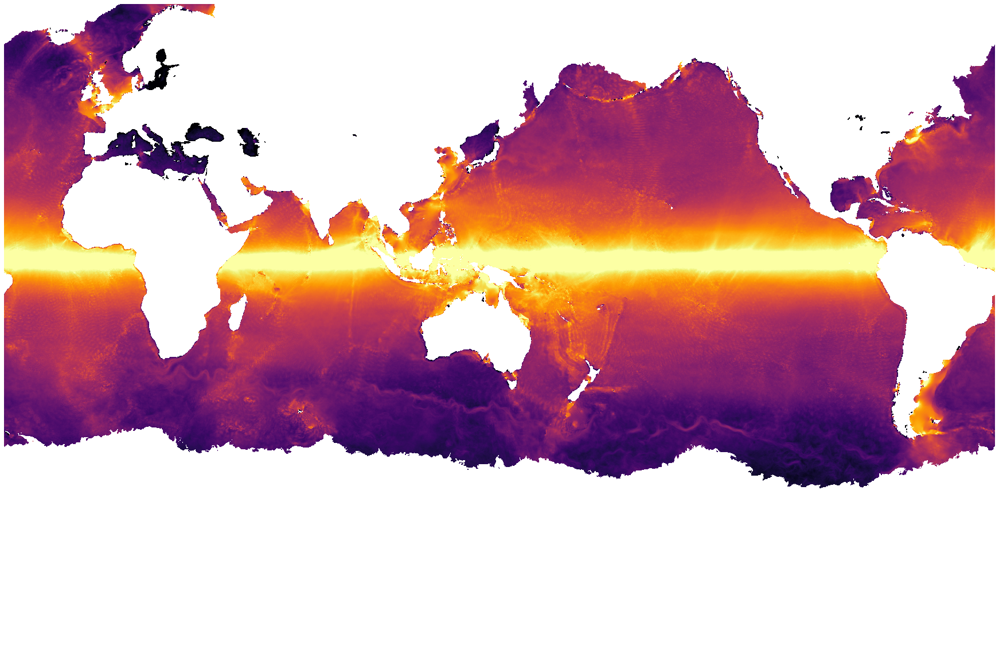

In [10]:
quick_llc_plot(np.log10(ds_omega.E_omega.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

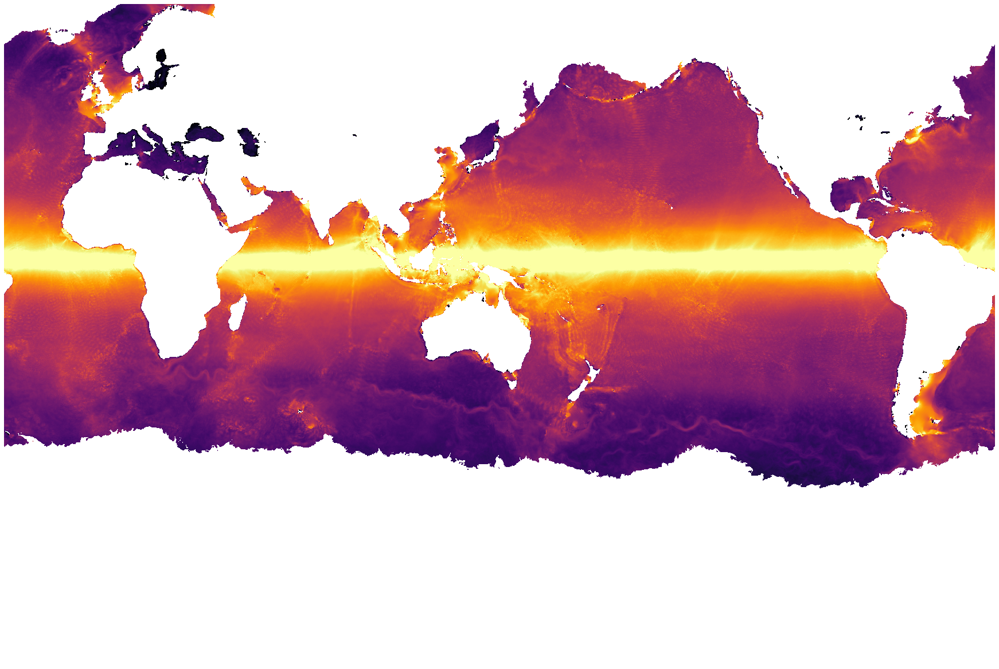

In [11]:
quick_llc_plot(np.log10(ds_omega.E_omega_all.where(ice>0)), vmin=-3, vmax=1, add_colorbar=False, axis_off=True, cmap='inferno')

In [12]:
ds_ice = xr.open_zarr(work_data_dir+'xy/sea_ice_mask.zarr')
dij=4 
ice = ds_ice.AREA.isel(i=slice(0,None,dij), j=slice(0,None,dij)) 
ice

<xarray.DataArray 'AREA' (face: 13, j: 1080, i: 1080)>
dask.array<getitem, shape=(13, 1080, 1080), dtype=float64, chunksize=(1, 1080, 1080), chunktype=numpy.ndarray>
Coordinates:
  * face     (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i        (i) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316
  * j        (j) int64 0 4 8 12 16 20 24 ... 4292 4296 4300 4304 4308 4312 4316

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

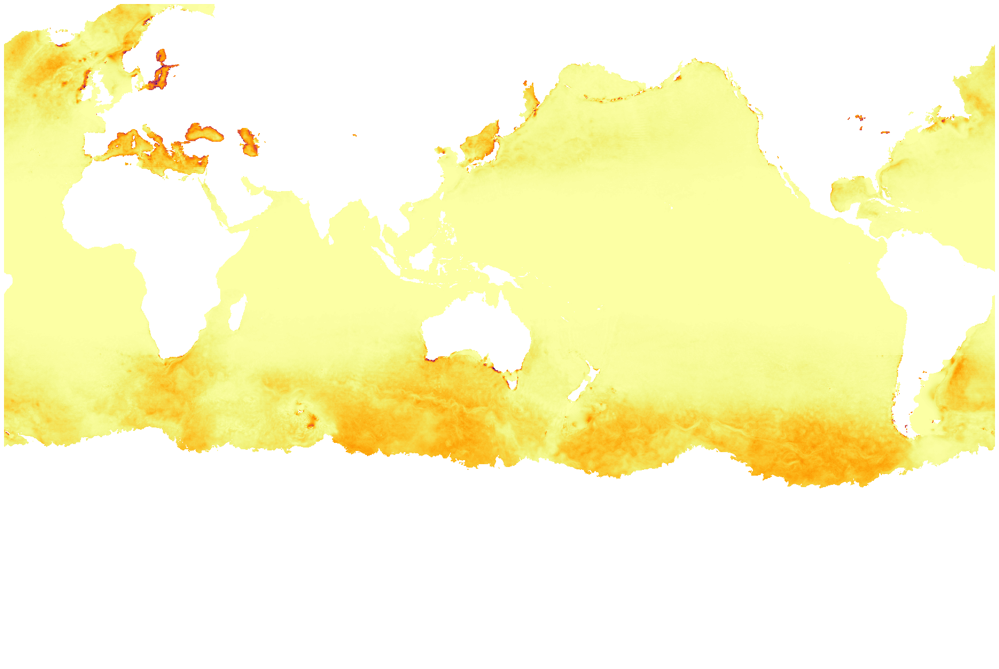

In [13]:
quick_llc_plot(np.log10(ds_omega.E_omega.where(ice>0)/ds_omega.E_omega_all.where(ice>0)), vmin= -1, vmax = 0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

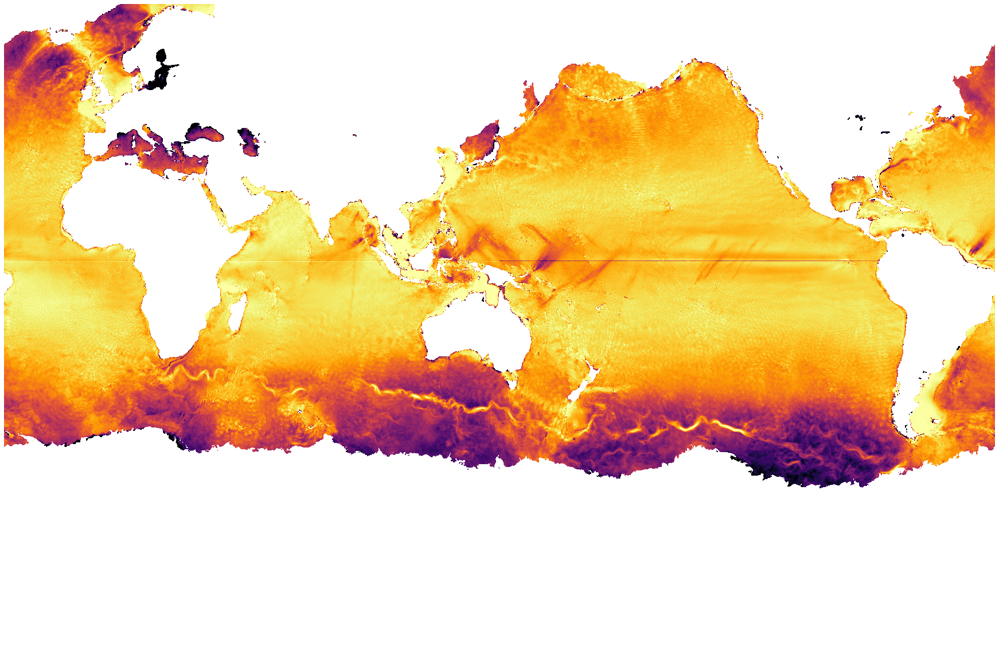

In [14]:
quick_llc_plot(np.log10(ds_omega.E_omega.where(ice>0)/E_ageo.where(ice>0)), vmin= -1, vmax = 0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

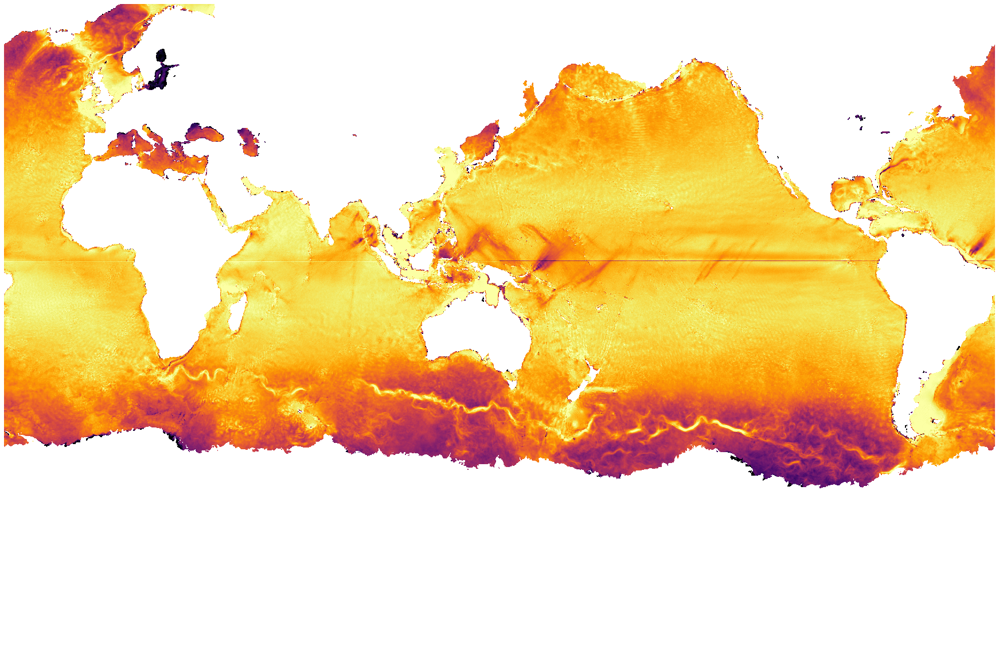

In [15]:
quick_llc_plot(np.log10(ds_omega.E_omega_all.where(ice>0)/E_ageo.where(ice>0)), vmin= -1, vmax = 0, add_colorbar=False, axis_off=True, cmap='inferno')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

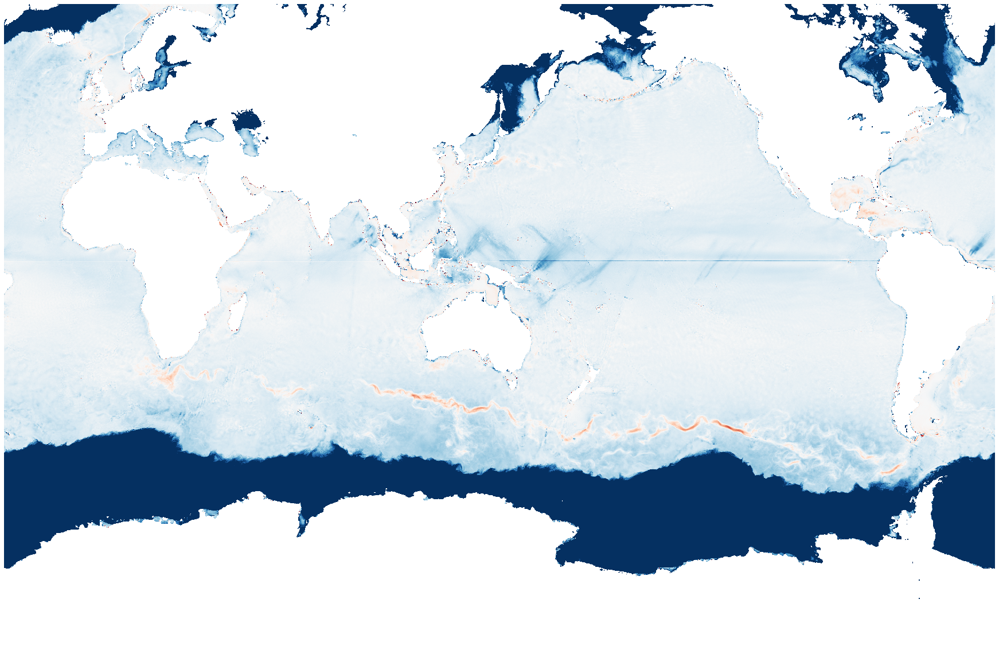

In [17]:
quick_llc_plot(np.log10(ds_omega.E_omega/E_ageo_high), vmin= -1, vmax = 1, add_colorbar=False, axis_off=True, cmap='RdBu_r')

/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as well unless you specify transpose_coords=False.
  
/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/ipykernel_launcher.py:14: FutureWarning: This DataArray contains multi-dimensional coordinates. In the future, these coordinates will be transposed as

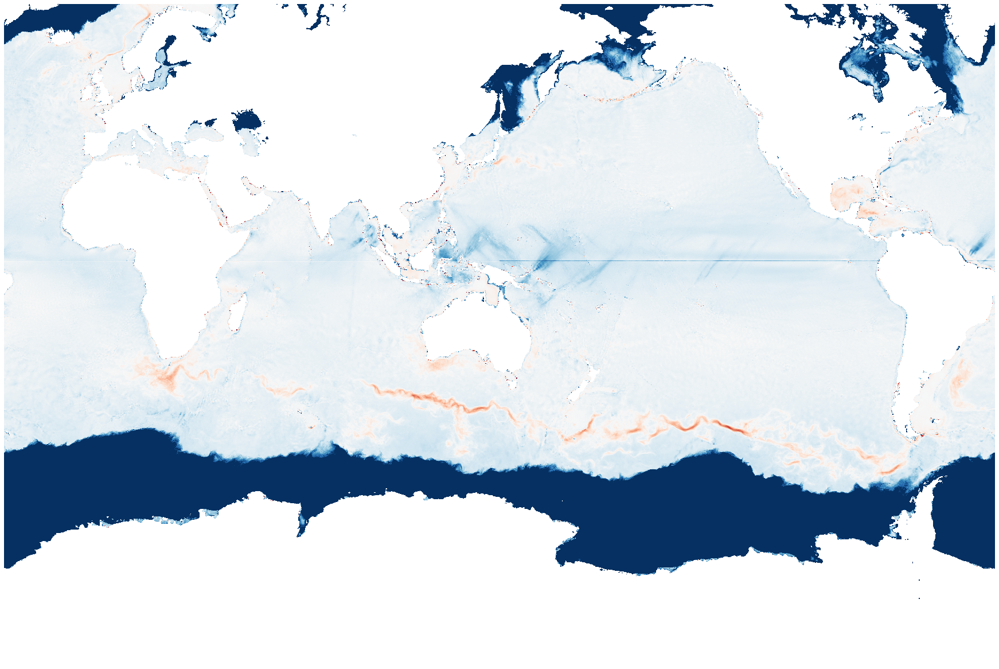

In [19]:
quick_llc_plot(np.log10(ds_omega.E_omega_all/E_ageo_high), vmin= -1, vmax = 1, add_colorbar=False, axis_off=True, cmap='RdBu_r')

__________
# 2. One face check

In [11]:
face_all = [1]

open_ocean_depth = 1000

for face in face_all:
    
    ds = xr.open_zarr(work_data_dir+'xy/total_uv/E_uv_f%02d.zarr'%(face))
    chunks={'i': 188, 'j':192, 'freq_time':1440}
    ds = ds.chunk(chunks)     
    E = ds.uv
    E = E.assign_coords(freq_cps=E.freq_time / 86400.)       
    
    df=E.freq_cps[1]-E.freq_cps[0]

    # near-inertial
    f_llc = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.YC))
    f_cpd_llc = f_llc*86400/2./np.pi    
    E_f = (E.where((abs(E.freq_time+f_cpd_llc)<0.1) & (E.Depth>open_ocean_depth), other=0.)*df).sum(dim='freq_time')

    # E_omega  
    E_omega = (E.where( (abs(E.freq_time) > abs(f_cpd_llc) ) & (E.Depth>open_ocean_depth), other=0.)*df*((E.freq_time/f_cpd_llc)**2)).sum(dim='freq_time')
    E_omega1 = (E.where(E.Depth>open_ocean_depth, other=0.)*df*((E.freq_time/f_cpd_llc)**2)).sum(dim='freq_time')
    #E_omega = (E.where( (abs(E.freq_time) > 4 ) & (E.Depth>open_ocean_depth), other=0.)*df*((E.freq_time.where(abs(E.freq_time) > 4)/f_cpd_llc)**2)).sum(dim='freq_time')


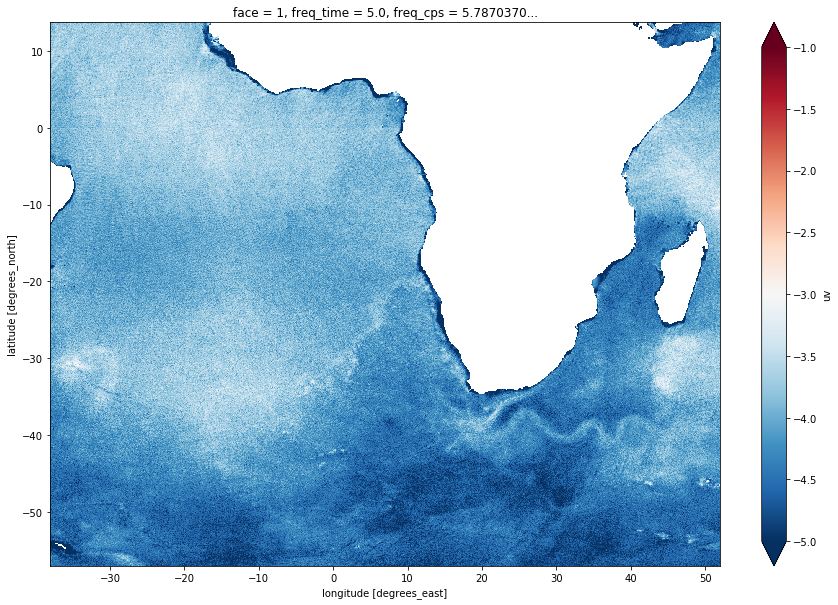

In [16]:
fig = plt.figure(figsize=(15,10))
np.log10(E.sel(freq_time=5., method='nearest')).plot(x='XC', y='YC',vmin=-5,vmax=-1,cmap='RdBu_r')

In [6]:
face_all = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
D = [xr.open_zarr(work_data_dir+'xy/Ageo_uv/E_band_integral_f%02d_1080_open.zarr'%(face)) for face in face_all] 
ds_ageo = xr.concat(D, dim='face')
E_ageo = ds_ageo.E_all
E_ageo_high = ds_ageo.E_high

In [83]:
E1 = E.sel(i=3300,j=1300).persist()
E2 = E.sel(i=3300,j=1200).persist()
E1a = ds_ageo.uv_ageo.sel(i=3300,j=1300).persist()
E2a = ds_ageo.uv_ageo.sel(i=3300,j=1200).persist()

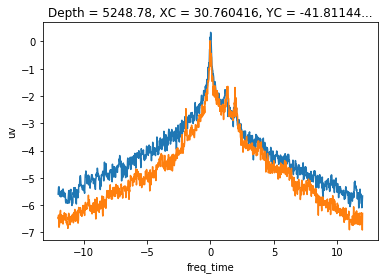

In [81]:
np.log10(E1).plot()
np.log10(E2).plot()

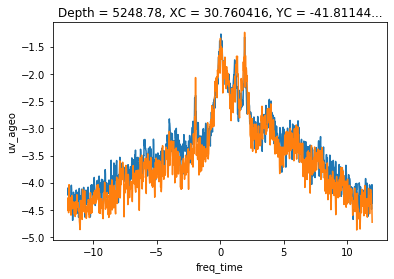

In [84]:
np.log10(E1a).plot()
np.log10(E2a).plot()

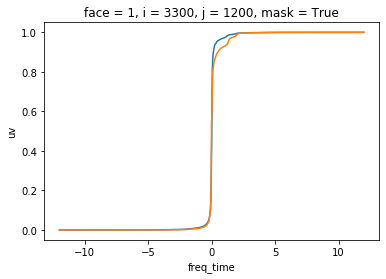

In [87]:
(E1.cumsum('freq_time')/E1.sum('freq_time')).plot()
(E2.cumsum('freq_time')/E2.sum('freq_time')).plot()

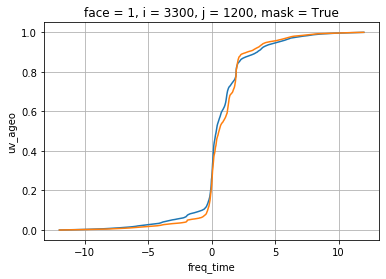

In [89]:
(E1a.cumsum('freq_time')/E1a.sum('freq_time')).plot()
(E2a.cumsum('freq_time')/E2a.sum('freq_time')).plot()
plt.grid()

In [100]:
print((E1.sum()).values)
print((E2.sum()).values)

14.433600716096635
5.658528587499134


In [99]:
print((E1.where(np.abs(E1.freq_time)<1.).sum()).values)
print((E2.where(np.abs(E2.freq_time)<1.).sum()).values)

13.85416688513942
5.21037040266674


In [98]:
print((E1a.where(np.abs(E1a.freq_time)<1.).sum()).values)
print((E2a.where(np.abs(E2a.freq_time)<1.).sum()).values)

1.144581162778195
1.0389578466129024


In [97]:
print((E1a.where(np.abs(E1a.freq_time)<1.).sum()/E1a.sum('freq_time')).values)
print((E2a.where(np.abs(E2a.freq_time)<1.).sum()/E2a.sum('freq_time')).values)

0.5275748194320872
0.49847404812937246


In [ ]:
(E1a.where(np.abs(E1a.freq_time)<1.).sum()/E1a.sum('freq_time')).values

Text(0.5, 1.0, '$E_{\\omega1}/E_{ageo-high}$')

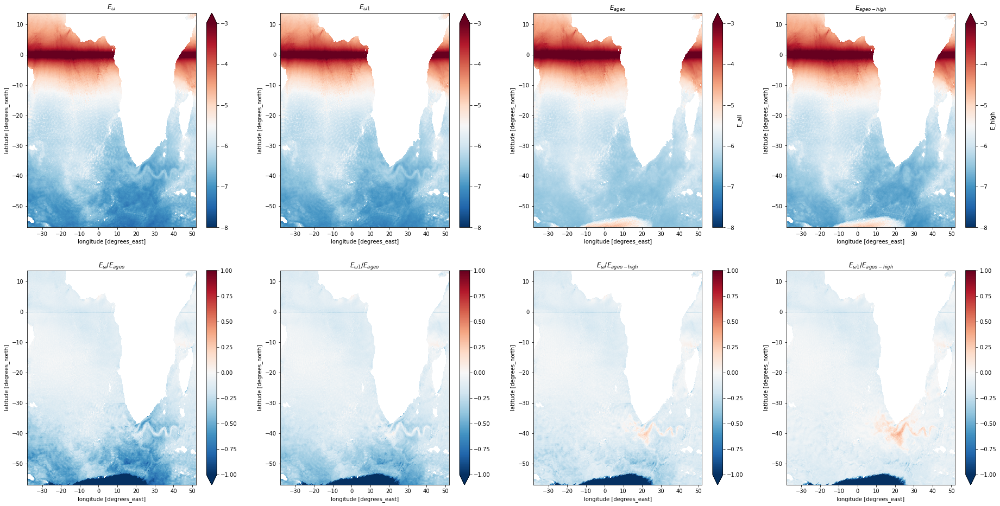

In [8]:
face = 1

fig = plt.figure(figsize = (32,16))

ax=plt.subplot(241)
np.log10(E_omega.where(E_omega.Depth>2000)).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{\omega}$')

ax=plt.subplot(242)
np.log10(E_omega1.where(E_omega1.Depth>2000)).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{\omega1}$')

ax=plt.subplot(243)
np.log10(ds_ageo['E_all'].isel(face=face)).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{ageo}$')

ax=plt.subplot(244)
np.log10(ds_ageo['E_high'].isel(face=face)).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{ageo-high}$')

ax=plt.subplot(245)
np.log10(E_omega/ds_ageo.E_all.isel(face=face)).plot(x='XC',y='YC',vmin=-1,vmax=1,cmap='RdBu_r')
ax.set_title('$E_{\omega}/E_{ageo}$')

ax=plt.subplot(246)
np.log10(E_omega1/ds_ageo.E_all.isel(face=face)).plot(x='XC',y='YC',vmin=-1,vmax=1,cmap='RdBu_r')
ax.set_title('$E_{\omega1}/E_{ageo}$')

ax=plt.subplot(247)
np.log10(E_omega/ds_ageo.E_high.isel(face=face)).plot(x='XC',y='YC',vmin=-1,vmax=1,cmap='RdBu_r')
ax.set_title('$E_{\omega}/E_{ageo-high}$')

ax=plt.subplot(248)
np.log10(E_omega1/ds_ageo.E_high.isel(face=face)).plot(x='XC',y='YC',vmin=-1,vmax=1,cmap='RdBu_r')
ax.set_title('$E_{\omega1}/E_{ageo-high}$')

#plt.savefig('/home/uz/yux/mit_equinox/hal/Geostrophy_assessment/Figures/Figure_3.png')

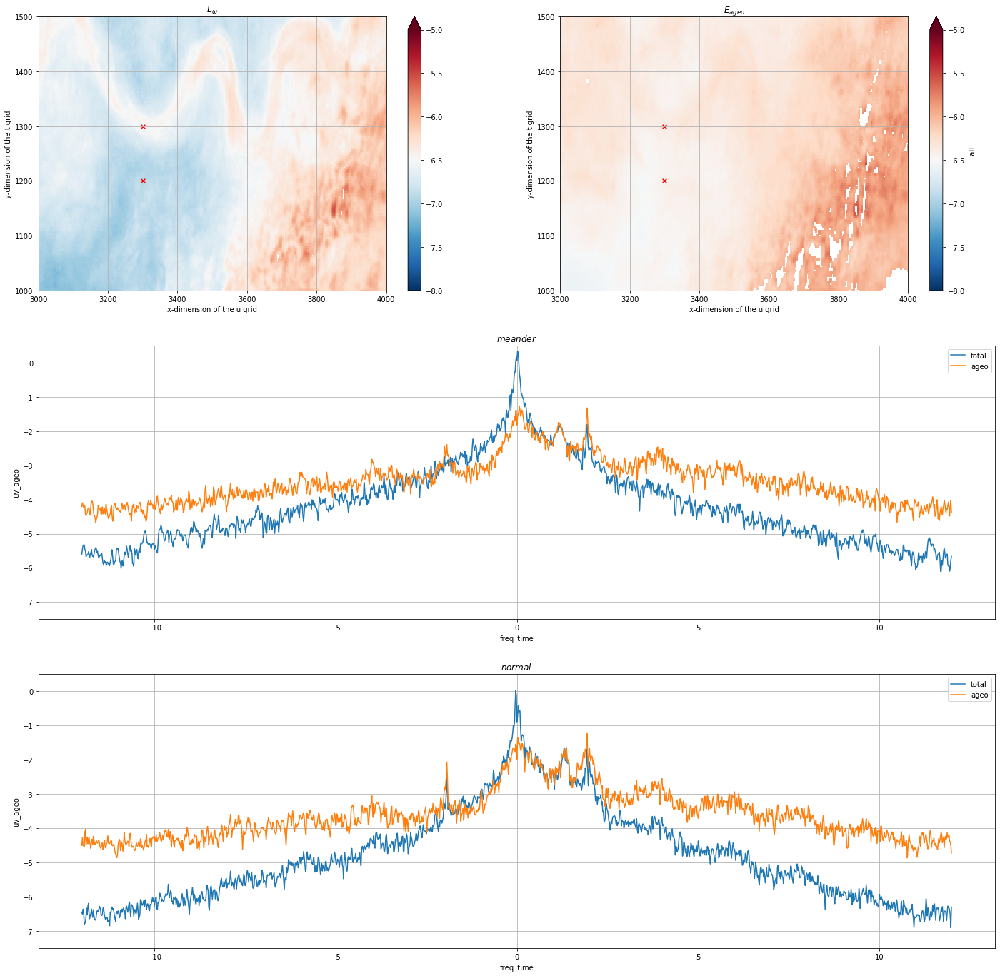

In [37]:
face = 1

fig = plt.figure(figsize = (24,24))

ax=plt.subplot(321)
np.log10(E_omega).plot(vmin=-8.,vmax=-5.,cmap='RdBu_r')
ax.set_title('$E_{\omega}$')
ax.set_xlim([3000,4000])
ax.set_ylim([1000,1500])
ax.grid()
ax.scatter(3300,1300,s=32,marker='x',color='r')
ax.scatter(3300,1200,s=32,marker='x',color='r')

labels = ['total', 'ageo']


ax=plt.subplot(322)
np.log10(ds_ageo_all.E_all.isel(face=face)).plot(vmin=-8.,vmax=-5.,cmap='RdBu_r')
ax.set_title('$E_{ageo}$')
ax.set_xlim([3000,4000])
ax.set_ylim([1000,1500])
ax.grid()
ax.scatter(3300,1300,s=32,marker='x',color='r')
ax.scatter(3300,1200,s=32,marker='x',color='r')

ax=plt.subplot(3,2,(3,4))
np.log10(ds.uv.sel(i=3300,j=1300)).plot(label=labels[0])
np.log10(ds_ageo.uv_ageo.sel(i=3300,j=1300)).plot(label=labels[1])
ax.set_title('$meander$')

ax.set_ylim([-7.5,0.5])
ax.legend()
ax.grid()

ax=plt.subplot(3,2,(5,6))
np.log10(ds.uv.sel(i=3300,j=1200)).plot(label=labels[0])
np.log10(ds_ageo.uv_ageo.sel(i=3300,j=1200)).plot(label=labels[1])
ax.set_ylim([-7.5,0.5])
ax.set_title('$normal$')

ax.legend()
ax.grid()


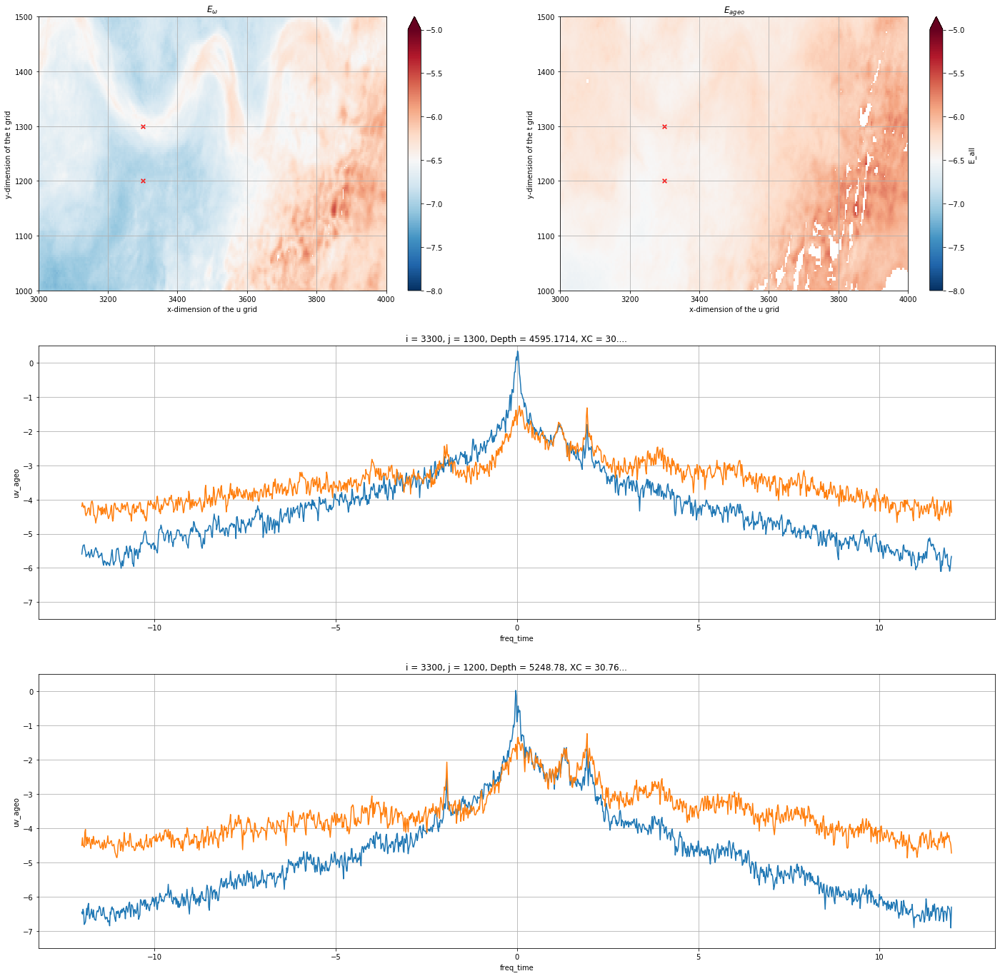

In [121]:
face = 1

fig = plt.figure(figsize = (24,24))

ax=plt.subplot(321)
np.log10(E_omega).plot(vmin=-8.,vmax=-5.,cmap='RdBu_r')
ax.set_title('$E_{\omega}$')
ax.set_xlim([3000,4000])
ax.set_ylim([1000,1500])
ax.grid()
ax.scatter(3300,1300,s=32,marker='x',color='r')
ax.scatter(3300,1200,s=32,marker='x',color='r')

labels = ['meander', 'normal']


ax=plt.subplot(322)
np.log10(ds_ageo_all.E_all.isel(face=face)).plot(vmin=-8.,vmax=-5.,cmap='RdBu_r')
ax.set_title('$E_{ageo}$')
ax.set_xlim([3000,4000])
ax.set_ylim([1000,1500])
ax.grid()
ax.scatter(3300,1300,s=32,marker='x',color='r')
ax.scatter(3300,1200,s=32,marker='x',color='r')

ax=plt.subplot(3,2,(3,4))
np.log10(ds.uv.sel(i=3300,j=1300)).plot(label=labels[0])
np.log10(ds_ageo.uv_ageo.sel(face=1,i=3300,j=1300)).plot(,label=labels[1])
ax.set_ylim([-7.5,0.5])
ax.legend()
ax.grid()

ax=plt.subplot(3,2,(5,6))
np.log10(ds.uv.sel(i=3300,j=1200)).plot()
np.log10(ds_ageo.uv_ageo.sel(face=1,i=3300,j=1200)).plot()
ax.set_ylim([-7.5,0.5])
ax.grid()


Text(0.5, 1.0, 'ageo. uv')

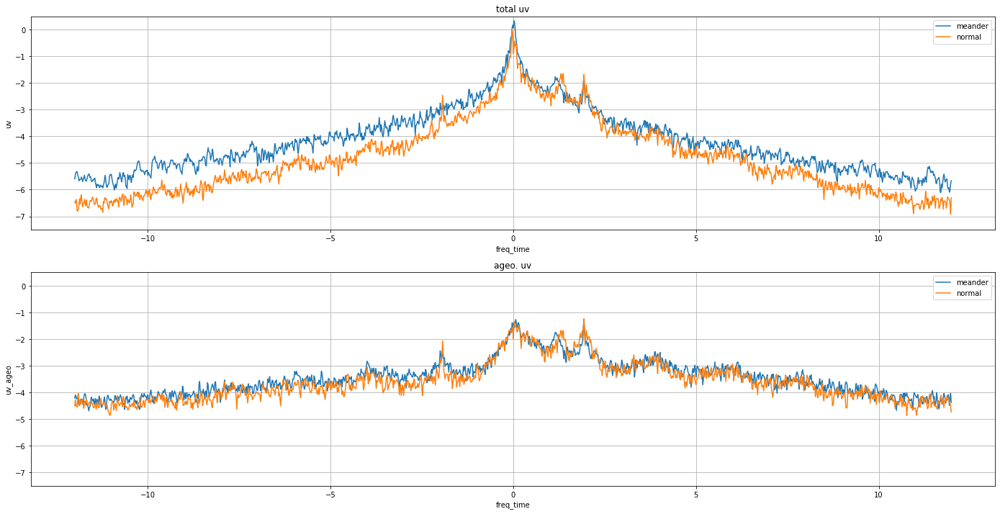

In [40]:
face = 1


labels = ['meander', 'normal']

fig = plt.figure(figsize = (24,12))

ax=plt.subplot(2,1,1)
np.log10(ds.uv.sel(i=3300,j=1300)).plot(label=labels[0])
np.log10(ds.uv.sel(i=3300,j=1200)).plot(label=labels[1])
ax.set_ylim([-7.5,0.5])
ax.grid()
ax.legend()
ax.set_title('total uv')

ax=plt.subplot(2,1,2)
np.log10(ds_ageo.uv_ageo.sel(i=3300,j=1300)).plot(label=labels[0])
np.log10(ds_ageo.uv_ageo.sel(i=3300,j=1200)).plot(label=labels[1])
ax.set_ylim([-7.5,0.5])
ax.grid()
ax.legend()
ax.set_title('ageo. uv')


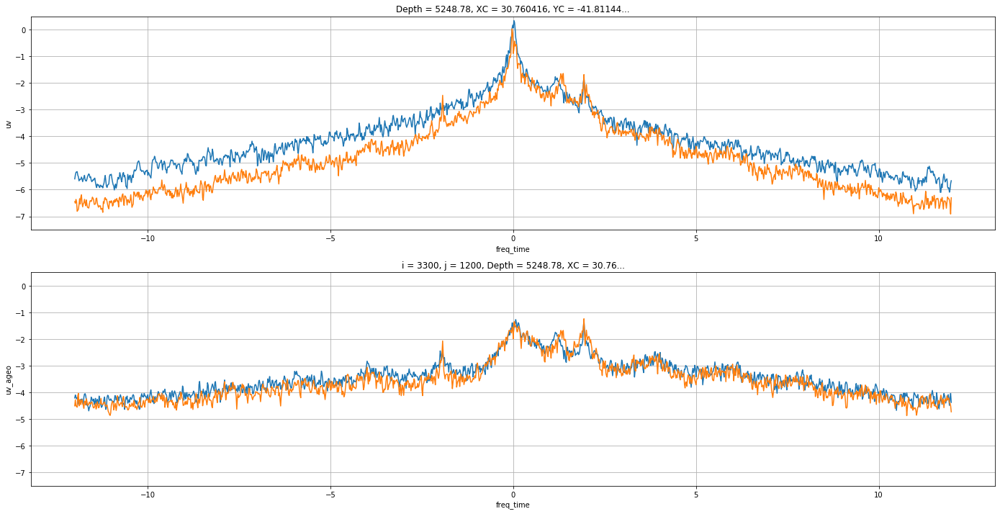

In [123]:
face = 1

fig = plt.figure(figsize = (24,12))

ax=plt.subplot(2,1,1)
np.log10(ds.uv.sel(i=3300,j=1300)).plot()
np.log10(ds.uv.sel(i=3300,j=1200)).plot()
ax.set_ylim([-7.5,0.5])
ax.grid()

ax=plt.subplot(2,1,2)
np.log10(ds_ageo.uv_ageo.sel(face=1,i=3300,j=1300)).plot()
np.log10(ds_ageo.uv_ageo.sel(face=1,i=3300,j=1200)).plot()
ax.set_ylim([-7.5,0.5])
ax.grid()


In [41]:
face_all = [4]

open_ocean_depth = 1000

for face in face_all:
    
    ds = xr.open_zarr(work_data_dir+'xy/total_uv/E_uv_f%02d.zarr'%(face))
    chunks={'i': 188, 'j':192, 'freq_time':1440}
    ds = ds.chunk(chunks)     
    E = ds.uv
    E = E.assign_coords(freq_cps=E.freq_time / 86400.) 
    
    
    ds_ageo = xr.open_zarr(work_data_dir+'xy/Ageo_uv/E_ageo_uv_f%02d.zarr'%(face))
    ds_ageo = ds_ageo.chunk(chunks)        
    
    df=E.freq_cps[1]-E.freq_cps[0]

    # near-inertial
    f_llc = 2.*2.*np.pi/86400. * np.sin(np.deg2rad(E.YC))
    f_cpd_llc = f_llc*86400/2./np.pi    
    E_f = (E.where((abs(E.freq_time+f_cpd_llc)<0.1) & (E.Depth>open_ocean_depth), other=0.)*df).sum(dim='freq_time')

    # E_omega  
    E_omega = (E.where( (abs(E.freq_time) > abs(f_cpd_llc) ) & (E.Depth>open_ocean_depth), other=0.)*df*((E.freq_time/f_cpd_llc)**2)).sum(dim='freq_time')
    E_omega1 = (E.where( (abs(E.freq_time) > 0 ) & (E.Depth>open_ocean_depth), other=0.)*df*((E.freq_time/f_cpd_llc)**2)*np.log10(E_total_all.isel(face=face)/E_total_high.isel(face=face))).sum(dim='freq_time')


Text(0.5, 1.0, '$E_{all}$')

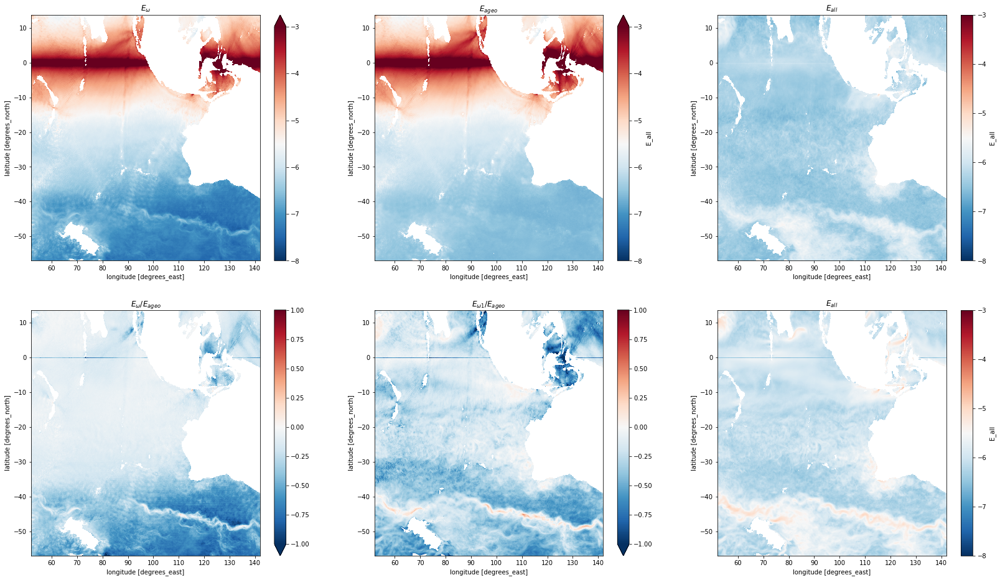

In [42]:
face = 4

fig = plt.figure(figsize = (28,16))

ax=plt.subplot(231)
np.log10(E_omega.where(E_omega.Depth>2000)).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{\omega}$')

ax=plt.subplot(232)
np.log10(ds_ageo_all['E_all'].isel(face=face)).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{ageo}$')

ax=plt.subplot(233)
np.log10(ds_all.E_all.isel(face=face)).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{all}$')

ax=plt.subplot(234)
np.log10(E_omega/ds_ageo_all.E_all.isel(face=face)).plot(x='XC',y='YC',vmin=-1,vmax=1,cmap='RdBu_r')
ax.set_title('$E_{\omega}/E_{ageo}$')

ax=plt.subplot(235)
np.log10(E_omega1/ds_ageo_all.E_all.isel(face=face)).plot(x='XC',y='YC',vmin=-1,vmax=1,cmap='RdBu_r')
ax.set_title('$E_{\omega1}/E_{ageo}$')

ax=plt.subplot(236)
np.log10(E_total_all).isel(face=face).plot(x='XC', y='YC',vmin=-8.,vmax=-3.,cmap='RdBu_r')
ax.set_title('$E_{all}$')

#plt.savefig('/home/uz/yux/mit_equinox/hal/Geostrophy_assessment/Figures/Figure_3.png')

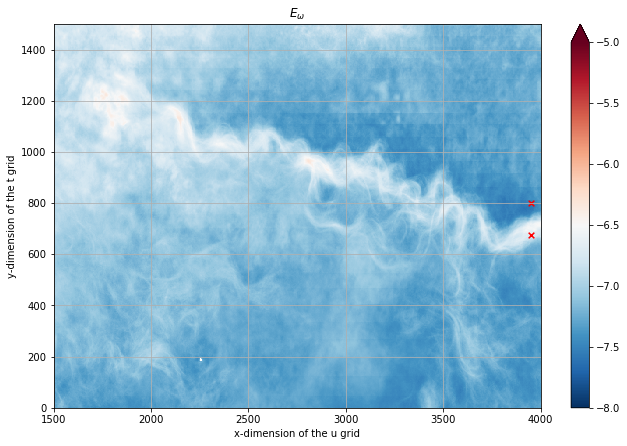

In [46]:
fig = plt.figure(figsize = (24,24))

ax=plt.subplot(321)
np.log10(E_omega).plot(vmin=-8.,vmax=-5.,cmap='RdBu_r')
ax.set_title('$E_{\omega}$')
ax.set_xlim([1500,4000])
ax.set_ylim([0,1500])
ax.grid()
ax.scatter(3950,675,s=32,marker='x',color='r')
ax.scatter(3950,800,s=32,marker='x',color='r')

In [67]:
675/4

168.75

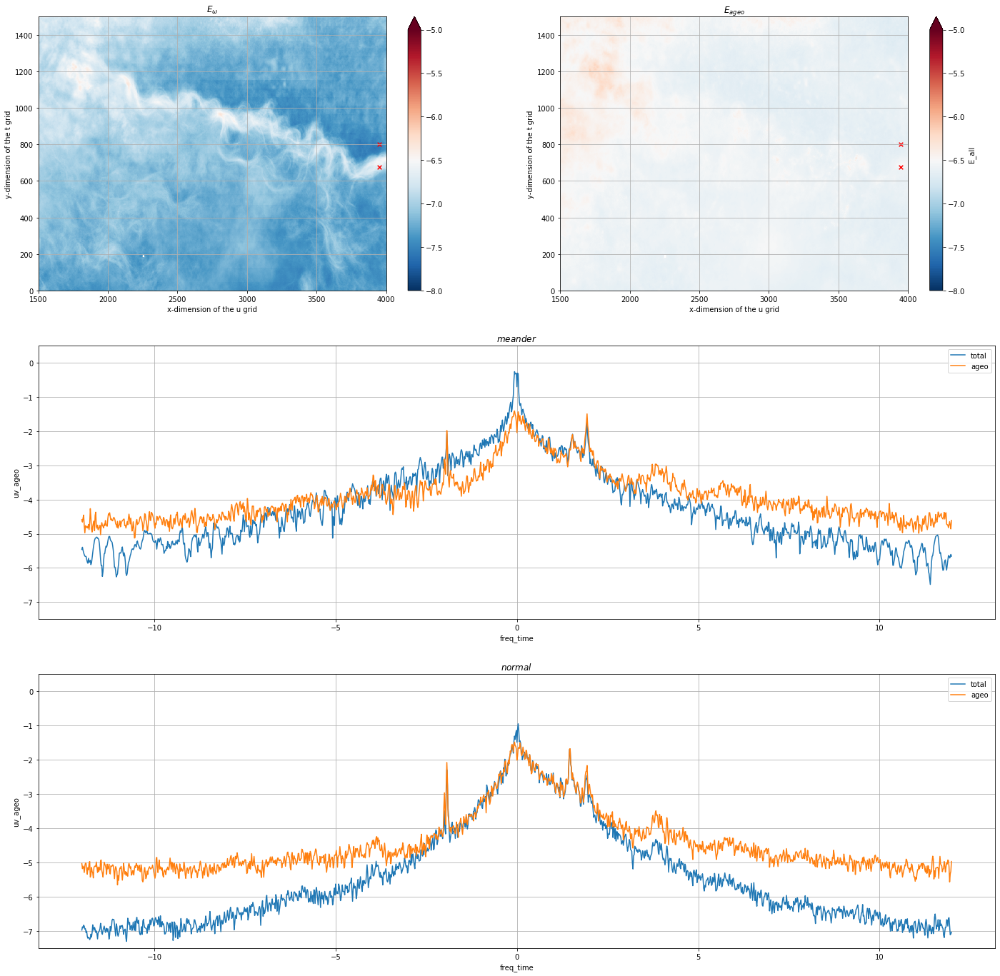

In [70]:
face = 4

fig = plt.figure(figsize = (24,24))

ax=plt.subplot(321)
np.log10(E_omega).plot(vmin=-8.,vmax=-5.,cmap='RdBu_r')
ax.set_title('$E_{\omega}$')
ax.set_xlim([1500,4000])
ax.set_ylim([0,1500])
ax.grid()
ax.scatter(3950,675,s=32,marker='x',color='r')
ax.scatter(3950,800,s=32,marker='x',color='r')

labels = ['total', 'ageo']


ax=plt.subplot(322)
np.log10(ds_ageo_all.E_all.isel(face=face)).plot(vmin=-8.,vmax=-5.,cmap='RdBu_r')
ax.set_title('$E_{ageo}$')
ax.set_xlim([1500,4000])
ax.set_ylim([0,1500])
ax.grid()
ax.scatter(3950,675,s=32,marker='x',color='r')
ax.scatter(3950,800,s=32,marker='x',color='r')


ax=plt.subplot(3,2,(3,4))
np.log10(ds.uv.isel(i=987,j=169)).plot(label=labels[0])
np.log10(ds_ageo.uv_ageo.isel(i=987,j=169)).plot(label=labels[1])
ax.set_title('$meander$')
ax.set_ylim([-7.5,0.5])
ax.legend()
ax.grid()

ax=plt.subplot(3,2,(5,6))
np.log10(ds.uv.isel(i=987,j=200)).plot(label=labels[0])
np.log10(ds_ageo.uv_ageo.isel(i=987,j=200)).plot(label=labels[1])
ax.set_ylim([-7.5,0.5])
ax.set_title('$normal$')
ax.legend()
ax.grid()


Text(0.5, 1.0, 'ageo. uv')

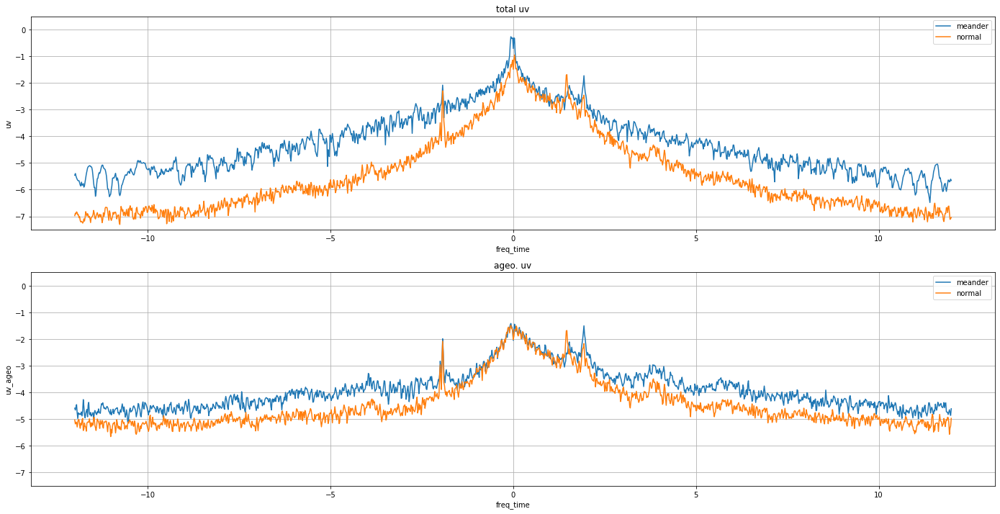

In [72]:
face = 1


labels = ['meander', 'normal']

fig = plt.figure(figsize = (24,12))

ax=plt.subplot(2,1,1)
np.log10(ds.uv.isel(i=987,j=169)).plot(label=labels[0])
np.log10(ds.uv.isel(i=987,j=200)).plot(label=labels[1])
ax.set_ylim([-7.5,0.5])
ax.grid()
ax.legend()
ax.set_title('total uv')

ax=plt.subplot(2,1,2)
np.log10(ds_ageo.uv_ageo.isel(i=987,j=169)).plot(label=labels[0])
np.log10(ds_ageo.uv_ageo.isel(i=987,j=200)).plot(label=labels[1])
ax.set_ylim([-7.5,0.5])
ax.grid()
ax.legend()
ax.set_title('ageo. uv')


In [12]:
cluster.close()

distributed.client - ERROR - Failed to reconnect to scheduler after 10.00 seconds, closing client
distributed.utils - ERROR - 
Traceback (most recent call last):
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/utils.py", line 666, in log_errors
    yield
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/client.py", line 1276, in _close
    await gen.with_timeout(timedelta(seconds=2), list(coroutines))
concurrent.futures._base.CancelledError
distributed.utils - ERROR - 
Traceback (most recent call last):
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/utils.py", line 666, in log_errors
    yield
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/client.py", line 1005, in _reconnect
    await self._close()
  File "/home/uz/yux/.conda/envs/equinox/lib/python3.7/site-packages/distributed/client.py", line 1276, in _close
    await gen.with_timeout(timedelta(seconds=